# **Proyek Image Classification: Road Sign**

- **Nama**: Talitha Agus Shakira
- **Email**: tshakira20@gmail.com
- **ID Dicoding**: talitha_as

<br>

---

## 📌 **Introduction**

Rambu lalu lintas memainkan peran penting dalam menjaga keselamatan dan keteraturan lalu lintas. Dalam kondisi dunia nyata, rambu-rambu ini bisa tampak berbeda-beda tergantung sudut pandang, pencahayaan, atau kualitas kamera, sehingga sistem otomatisasi berbasis pengenalan citra dibutuhkan untuk meningkatkan akurasi deteksi.

Dalam proyek ini, saya membangun model klasifikasi citra berbasis **Computer Vision** dan **Convolutional Neural Network (CNN)** untuk mengenali berbagai jenis **rambu lalu lintas** dari gambar. Model ini dilatih untuk mengklasifikasikan gambar ke dalam 17 kelas berbeda rambu lalu lintas, antara lain:

* **speed-20** – Batas kecepatan 20 km/jam
* **speed-30** – Batas kecepatan 30 km/jam
* **speed-50** – Batas kecepatan 50 km/jam
* **speed-60** – Batas kecepatan 60 km/jam
* **speed-70** – Batas kecepatan 70 km/jam
* **speed-100** – Batas kecepatan 100 km/jam
* **road-works** – Pekerjaan jalan
* **one-way-traffic** – Lalu lintas satu arah
* **yield** – Beri jalan
* **stop** – Berhenti
* **road-narrows** – Jalan menyempit
* **no-entry** – Dilarang masuk
* **uneven-road** – Jalan tidak rata
* **overtaking-forbidden** – Dilarang menyalip
* **double-curve** – Tikungan ganda
* **slippery-road** – Jalan licin

Model ini bertujuan untuk membantu sistem kendaraan cerdas, proyek smart city, atau aplikasi edukasi lalu lintas dengan memberikan klasifikasi rambu secara otomatis dan efisien.

Proyek ini mencakup tahapan preprocessing gambar, augmentasi data, pelatihan model CNN, evaluasi performa, dan penyimpanan model ke berbagai format siap deploy seperti **TensorFlow SavedModel**, **TensorFlow Lite** (untuk mobile/embedded), dan **TensorFlow\.js** (untuk aplikasi berbasis web).



## 📌 **Dataset**

Dataset ini berjudul **Road Sign Detecting** dan disediakan oleh komunitas **Projects** melalui platform **Roboflow Universe**. Dataset ini dirancang untuk tugas **klasifikasi gambar** guna mengenali berbagai jenis **rambu lalu lintas**.

📊 **Informasi Umum**:

* **Jumlah Kelas**: 17 kelas berbeda, yaitu:

  * **speed-20** – Batas kecepatan 20 km/jam
  * **speed-30** – Batas kecepatan 30 km/jam
  * **speed-50** – Batas kecepatan 50 km/jam
  * **speed-60** – Batas kecepatan 60 km/jam
  * **speed-70** – Batas kecepatan 70 km/jam
  * **speed-100** – Batas kecepatan 100 km/jam
  * **road-works** – Pekerjaan jalan
  * **one-way-traffic** – Lalu lintas satu arah
  * **yield** – Beri jalan
  * **stop** – Berhenti
  * **road-narrows** – Jalan menyempit
  * **no-entry** – Dilarang masuk
  * **uneven-road** – Jalan tidak rata
  * **overtaking-forbidden** – Dilarang menyalip
  * **double-curve** – Tikungan ganda
  * **slippery-road** – Jalan licin
* **Lisensi**: CC BY 4.0 (Creative Commons Attribution 4.0 International License)
* **Tanggal Rilis**: Tidak disebutkan secara eksplisit di halaman dataset
* **Sumber**: [Roboflow Universe – Road Sign Detecting](https://universe.roboflow.com/projects-xmgv3/road-sign-detecting-aehjf)




---

### **Import Library**

In [1]:
!pip install roboflow

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.4/85.4 kB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 3.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 9.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 48.0 MB/s eta 0:00:00
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.11.0.86
    Uninstalling opencv-python-headless-4.11.0.86:
      Successfully uninstalled opencv-python-headless-4.11.0.86
  Attempting uninstall: idna
    Found existing installation: idna 3.10
    Uninstalling idna-3.10:
      Successfully uninstalled idna-3.10


**Common Library**

In [2]:
import os, shutil
import zipfile
import random
from random import sample
import shutil
from shutil import copyfile
import pathlib
from pathlib import Path
import numpy as np
from collections import Counter
from PIL import Image
import pandas as pd
from tqdm.notebook import tqdm as tq
import matplotlib.pyplot as plt

**Image Processing Library**

In [3]:
import cv2
from PIL import Image
import skimage
from skimage import io
from skimage.transform import resize
from skimage.transform import rotate, AffineTransform, warp
from skimage import img_as_ubyte
from skimage.exposure import adjust_gamma
from skimage.util import random_noise

**Model Building Library**

In [4]:
import keras
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report
import tensorflow as tf
from tensorflow.keras import Model, layers
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator, img_to_array, load_img
from tensorflow.keras.optimizers import Adam, RMSprop, SGD
from tensorflow.keras.layers import InputLayer, Conv2D, SeparableConv2D, MaxPooling2D, MaxPool2D, Dense, Flatten, Dropout, BatchNormalization
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.applications import MobileNet
from tensorflow.keras.applications.densenet import DenseNet121
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import ModelCheckpoint, Callback, EarlyStopping, ReduceLROnPlateau

In [5]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

In [6]:
print(tf.__version__)

2.18.0


# **Data Loading**

In [7]:
from roboflow import Roboflow
from getpass import getpass
import os

os.environ["ROBOFLOW_API_KEY"] = getpass("Masukkan API Key kamu: ")

from roboflow import Roboflow
rf = Roboflow(api_key=os.environ["ROBOFLOW_API_KEY"])


Masukkan API Key kamu: ··········


In [8]:
project = rf.workspace("projects-xmgv3").project("road-sign-detecting-aehjf")
dataset = project.version(1).download("folder")

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Road-Sign-Detecting-1 in folder:: 100%|██████████| 15568/15568 [00:02<00:00, 6997.16it/s]


# **Data Preparation**

In [9]:
import os

data_dir = dataset.location

# Menampilkan hanya folder-folder (secara rekursif)
for root, dirs, _ in os.walk(data_dir):
    level = root.replace(data_dir, '').count(os.sep)
    indent = ' ' * 4 * level
    print(f"{indent}[Folder] {os.path.basename(root)}")


[Folder] Road-Sign-Detecting-1
    [Folder] test
        [Folder] speed-70
        [Folder] speed-60
        [Folder] speed-100
        [Folder] road-works
        [Folder] curve-to-left
        [Folder] one-way-traffic
        [Folder] yield
        [Folder] stop
        [Folder] speed-20
        [Folder] pass-this-side-right
        [Folder] speed-30
        [Folder] turn-left-ahead
        [Folder] pass-this-side-left
        [Folder] speed-50
        [Folder] turn-right-ahead
        [Folder] speed-120
        [Folder] go-straight-or-left
        [Folder] road-narrows
        [Folder] no-entry
        [Folder] end-of-speed-limitation-80
        [Folder] uneven-road
        [Folder] go-straight-or-right
        [Folder] overtaking-forbidden
        [Folder] double-curve
        [Folder] curve-to-right
        [Folder] speed-80
        [Folder] slippery-road
    [Folder] train
        [Folder] speed-70
        [Folder] speed-60
        [Folder] speed-100
        [Folder] road-works
 

In [10]:
import os
import shutil

# Daftar kelas yang ingin digunakan
classes = [
    'speed-20', 'speed-30', 'speed-50', 'speed-60', 'speed-70',
    'speed-100', 'road-works', 'one-way-traffic', 'yield', 'stop',
    'road-narrows', 'no-entry', 'uneven-road', 'overtaking-forbidden',
    'double-curve', 'slippery-road'
]

# Lokasi direktori dataset asli
data_dir = dataset.location
source_base = os.path.join('Road-Sign-Detecting-1')

# Buat direktori baru dengan nama 'dataset'
merged_dir = os.path.join(data_dir, 'dataset')
os.makedirs(merged_dir, exist_ok=True)

# Folder sumber: train, test, valid
source_folders = ['train', 'test', 'valid']

for folder in source_folders:
    folder_path = os.path.join(source_base, folder)
    if not os.path.exists(folder_path):
        print(f"Folder sumber tidak ditemukan: {folder_path}")
        continue

    # Iterasi hanya untuk kelas-kelas yang diinginkan
    for class_name in classes:
        class_path = os.path.join(folder_path, class_name)
        if os.path.isdir(class_path):
            # Buat folder kelas di 'dataset' kalau belum ada
            merged_class_path = os.path.join(merged_dir, class_name)
            os.makedirs(merged_class_path, exist_ok=True)

            # Salin seluruh gambar dari folder kelas ke folder gabungan
            for file in os.listdir(class_path):
                src_file = os.path.join(class_path, file)
                dst_file = os.path.join(merged_class_path, file)

                # Rename file jika sudah ada nama yang sama
                if os.path.exists(dst_file):
                    base, ext = os.path.splitext(file)
                    i = 1
                    while os.path.exists(dst_file):
                        dst_file = os.path.join(merged_class_path, f"{base}_{i}{ext}")
                        i += 1

                shutil.copy(src_file, dst_file)

print("✅ Dataset subset berhasil disalin ke folder 'dataset'.")


✅ Dataset subset berhasil disalin ke folder 'dataset'.


In [11]:
data_dir = dataset.location

# Menampilkan hanya folder-folder (secara rekursif)
for root, dirs, _ in os.walk(data_dir):
    level = root.replace(data_dir, '').count(os.sep)
    indent = ' ' * 4 * level
    print(f"{indent}[Folder] {os.path.basename(root)}")

[Folder] Road-Sign-Detecting-1
    [Folder] test
        [Folder] speed-70
        [Folder] speed-60
        [Folder] speed-100
        [Folder] road-works
        [Folder] curve-to-left
        [Folder] one-way-traffic
        [Folder] yield
        [Folder] stop
        [Folder] speed-20
        [Folder] pass-this-side-right
        [Folder] speed-30
        [Folder] turn-left-ahead
        [Folder] pass-this-side-left
        [Folder] speed-50
        [Folder] turn-right-ahead
        [Folder] speed-120
        [Folder] go-straight-or-left
        [Folder] road-narrows
        [Folder] no-entry
        [Folder] end-of-speed-limitation-80
        [Folder] uneven-road
        [Folder] go-straight-or-right
        [Folder] overtaking-forbidden
        [Folder] double-curve
        [Folder] curve-to-right
        [Folder] speed-80
        [Folder] slippery-road
    [Folder] dataset
        [Folder] speed-70
        [Folder] speed-60
        [Folder] speed-100
        [Folder] road-works

In [12]:
print("Isi dari direktori:", os.listdir(os.path.join(data_dir, 'dataset')))

Isi dari direktori: ['speed-70', 'speed-60', 'speed-100', 'road-works', 'one-way-traffic', 'yield', 'stop', 'speed-20', 'speed-30', 'speed-50', 'road-narrows', 'no-entry', 'uneven-road', 'overtaking-forbidden', 'double-curve', 'slippery-road']


# **Dataset Checking**

**Melihat distribusi kelas gambar**

In [13]:
dataset_dir = os.path.join(data_dir, 'dataset')

# Menyimpan jumlah file per kelas
class_counts = {}

# Iterasi tiap folder kelas
for class_name in os.listdir(dataset_dir):
    class_path = os.path.join(dataset_dir, class_name)
    if os.path.isdir(class_path):
        file_count = len([f for f in os.listdir(class_path) if os.path.isfile(os.path.join(class_path, f))])
        class_counts[class_name] = file_count

# Menampilkan hasil
print("Distribusi jumlah gambar per kelas:")
for class_name, count in sorted(class_counts.items()):
    print(f"- {class_name}: {count} gambar")

Distribusi jumlah gambar per kelas:
- double-curve: 182 gambar
- no-entry: 590 gambar
- one-way-traffic: 678 gambar
- overtaking-forbidden: 834 gambar
- road-narrows: 152 gambar
- road-works: 856 gambar
- slippery-road: 301 gambar
- speed-100: 853 gambar
- speed-20: 108 gambar
- speed-30: 1179 gambar
- speed-50: 1183 gambar
- speed-60: 978 gambar
- speed-70: 1072 gambar
- stop: 476 gambar
- uneven-road: 220 gambar
- yield: 1215 gambar


**Melihat isi dataset per kelas**

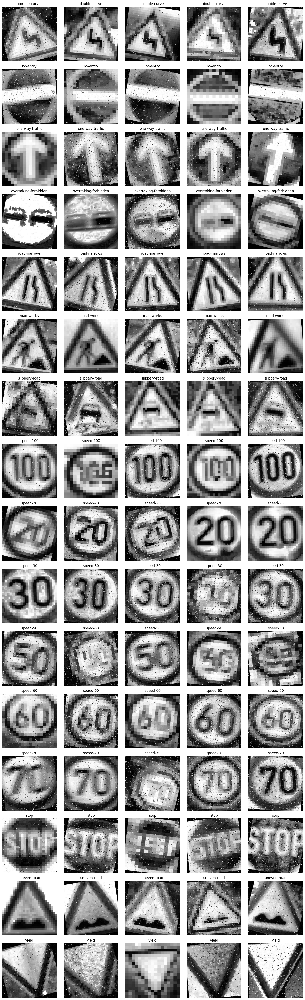

In [14]:
image_per_class = {}

for class_name in os.listdir(dataset_dir):
    class_path = os.path.join(dataset_dir, class_name)
    if os.path.isdir(class_path):
        image_per_class[class_name] = os.listdir(class_path)

# Menampilkan 5 gambar acak per kelas
fig, axs = plt.subplots(len(image_per_class), 5, figsize=(15, 3 * len(image_per_class)))

for i, class_name in enumerate(sorted(image_per_class.keys())):
    sample_images = np.random.choice(image_per_class[class_name], 5, replace=False)

    for j, image_file in enumerate(sample_images):
        img_path = os.path.join(dataset_dir, class_name, image_file)
        img = Image.open(img_path).convert("RGB")
        axs[i, j].imshow(img)
        axs[i, j].set_title(class_name)
        axs[i, j].axis('off')

plt.tight_layout()
plt.show()

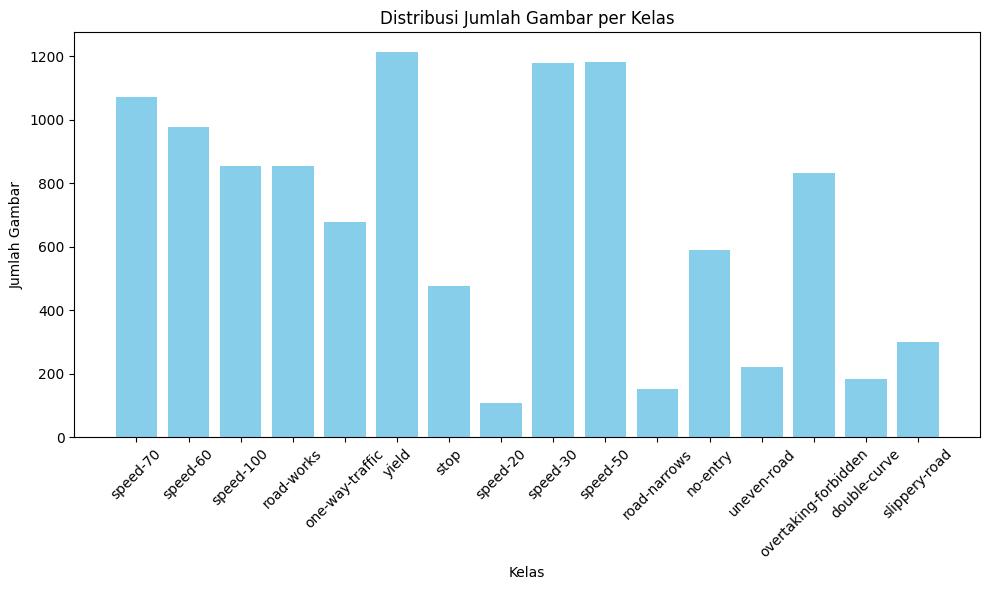

In [15]:
# Menyimpan jumlah gambar per kelas
class_counts = {}

for class_name in os.listdir(dataset_dir):
    class_path = os.path.join(dataset_dir, class_name)
    if os.path.isdir(class_path):
        count = len([
            f for f in os.listdir(class_path)
            if os.path.isfile(os.path.join(class_path, f))
        ])
        class_counts[class_name] = count

# Plot distribusi jumlah gambar
plt.figure(figsize=(10, 6))
plt.bar(class_counts.keys(), class_counts.values(), color='skyblue')
plt.xlabel('Kelas')
plt.ylabel('Jumlah Gambar')
plt.title('Distribusi Jumlah Gambar per Kelas')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# **Data Augmentation**

In [16]:
# Membuat fungsi untuk memberikan efek peningkatan kecerahan pada gambar
def add_brightness(img):
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    img = cv2.resize(img, (224,224))
    img = adjust_gamma(img, gamma=0.5,gain=1)
    return img

# Membuat fungsi untuk memberikan efek pergeseran acak pada gambar
def sheared(img):
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    img = cv2.resize(img, (224,224))
    transform = AffineTransform(shear=0.05)
    shear_image = warp(img, transform, mode="edge")
    shear_image = np.clip(shear_image * 255, 0, 255).astype(np.uint8)
    return shear_image

# Membuat fungsi untuk melakukan pergeseran melengkung pada gambar
def warp_shift(img):
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    img = cv2.resize(img, (224, 224))
    transform = AffineTransform(translation=(0, 40))
    warp_image = warp(img, transform, mode="edge")
    warp_image = np.clip(warp_image * 255, 0, 255).astype(np.uint8)
    return warp_image

In [17]:
# Membuat variabel transformasi yang akan menyimpan semua proses pra-pemrosesan yang telah dilakukan sebelumnya
transformations = { 'warp shift': warp_shift,
                    'add brightness' : add_brightness,
                    'shear image': sheared
                  }

In [18]:
def augment_class_images(class_src_dir, class_dst_dir, target_count, transformations):
    # Copy gambar asli dulu
    os.makedirs(class_dst_dir, exist_ok=True)
    for file in os.listdir(class_src_dir):
        src_file = os.path.join(class_src_dir, file)
        dst_file = os.path.join(class_dst_dir, file)
        if os.path.isfile(src_file):
            shutil.copy(src_file, dst_file)

    images = [f for f in os.listdir(class_dst_dir) if os.path.isfile(os.path.join(class_dst_dir, f))]
    current_count = len(images)
    needed = target_count - current_count

    if needed <= 0:
        print(f"{class_dst_dir}: Sudah mencapai target ({current_count} gambar).")
        return

    print(f"{class_dst_dir}: Butuh {needed} gambar tambahan untuk mencapai {target_count}.")

    i = 0
    while needed > 0:
        img_name = random.choice(images)
        img_path = os.path.join(class_dst_dir, img_name)

        img = cv2.imread(img_path)
        if img is None:
            print(f"Gagal membaca {img_path}, lanjutkan...")
            continue

        transform_name = random.choice(list(transformations.keys()))
        transform_func = transformations[transform_name]

        aug_img = transform_func(img)

        if aug_img.dtype != np.uint8:
            aug_img = (aug_img * 255).astype(np.uint8)

        save_name = f"aug_{transform_name.replace(' ', '_')}_{i}.jpg"
        save_path = os.path.join(class_dst_dir, save_name)
        cv2.imwrite(save_path, aug_img)

        needed -= 1
        i += 1


# Set path dataset asli dan folder augmented baru
augmented_dir = os.path.join(data_dir, 'augmented_data')
os.makedirs(augmented_dir, exist_ok=True)

# Target gambar per kelas (bisa disesuaikan)
target_per_class = 1500

for class_name in os.listdir(dataset_dir):
    class_src_dir = os.path.join(dataset_dir, class_name)
    class_dst_dir = os.path.join(augmented_dir, class_name)
    if os.path.isdir(class_src_dir):
        augment_class_images(class_src_dir, class_dst_dir, target_per_class, transformations)


/content/Road-Sign-Detecting-1/augmented_data/speed-70: Butuh 428 gambar tambahan untuk mencapai 1500.
/content/Road-Sign-Detecting-1/augmented_data/speed-60: Butuh 522 gambar tambahan untuk mencapai 1500.
/content/Road-Sign-Detecting-1/augmented_data/speed-100: Butuh 647 gambar tambahan untuk mencapai 1500.
/content/Road-Sign-Detecting-1/augmented_data/road-works: Butuh 644 gambar tambahan untuk mencapai 1500.
/content/Road-Sign-Detecting-1/augmented_data/one-way-traffic: Butuh 822 gambar tambahan untuk mencapai 1500.
/content/Road-Sign-Detecting-1/augmented_data/yield: Butuh 285 gambar tambahan untuk mencapai 1500.
/content/Road-Sign-Detecting-1/augmented_data/stop: Butuh 1024 gambar tambahan untuk mencapai 1500.
/content/Road-Sign-Detecting-1/augmented_data/speed-20: Butuh 1392 gambar tambahan untuk mencapai 1500.
/content/Road-Sign-Detecting-1/augmented_data/speed-30: Butuh 321 gambar tambahan untuk mencapai 1500.
/content/Road-Sign-Detecting-1/augmented_data/speed-50: Butuh 317 ga

Distribusi jumlah gambar per kelas (setelah augmentasi):
- double-curve: 1500 gambar
- no-entry: 1500 gambar
- one-way-traffic: 1500 gambar
- overtaking-forbidden: 1500 gambar
- road-narrows: 1500 gambar
- road-works: 1500 gambar
- slippery-road: 1500 gambar
- speed-100: 1500 gambar
- speed-20: 1500 gambar
- speed-30: 1500 gambar
- speed-50: 1500 gambar
- speed-60: 1500 gambar
- speed-70: 1500 gambar
- stop: 1500 gambar
- uneven-road: 1500 gambar
- yield: 1500 gambar


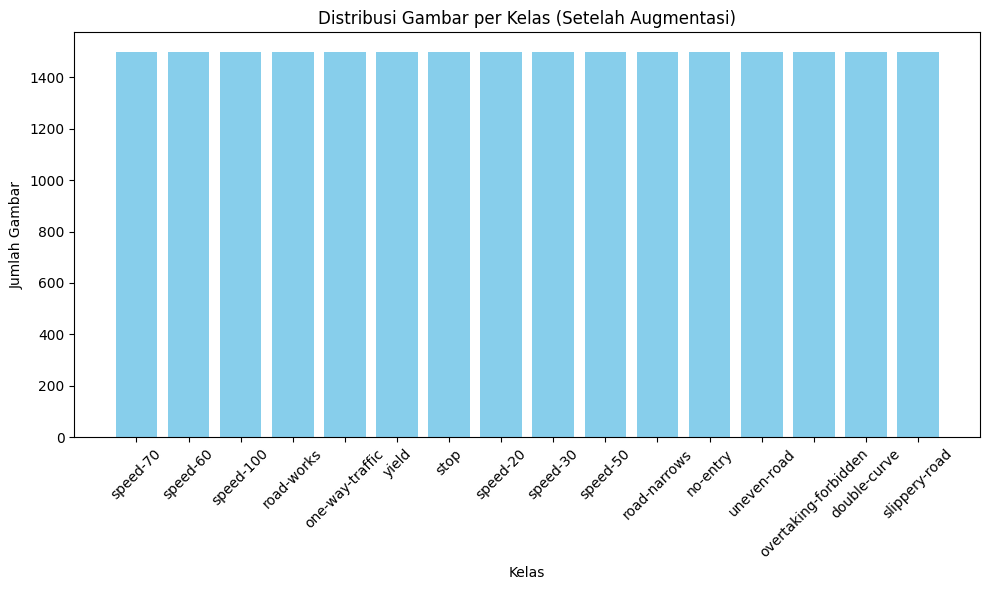

In [19]:
# Cek jumlah gambar per kelas
class_counts = {}
for class_name in os.listdir(augmented_dir):
    class_path = os.path.join(augmented_dir, class_name)
    if os.path.isdir(class_path):
        count = len([f for f in os.listdir(class_path) if os.path.isfile(os.path.join(class_path, f))])
        class_counts[class_name] = count

# Tampilkan hasil distribusi
print("Distribusi jumlah gambar per kelas (setelah augmentasi):")
for class_name, count in sorted(class_counts.items()):
    print(f"- {class_name}: {count} gambar")

# Plot distribusinya
plt.figure(figsize=(10, 6))
plt.bar(class_counts.keys(), class_counts.values(), color='skyblue')
plt.xlabel('Kelas')
plt.ylabel('Jumlah Gambar')
plt.title('Distribusi Gambar per Kelas (Setelah Augmentasi)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


#**Data Splitting**

In [20]:
# Panggil variabel mypath yang menampung folder dataset gambar
mypath= os.path.join(data_dir, 'augmented_data')

file_name = []
labels = []
full_path = []
for path, subdirs, files in os.walk(mypath):
    for name in files:
        full_path.append(os.path.join(path, name))
        labels.append(path.split('/')[-1])
        file_name.append(name)

# Memasukkan variabel yang sudah dikumpulkan pada looping di atas menjadi sebuah dataframe agar rapi
df = pd.DataFrame({"path":full_path,'file_name':file_name,"labels":labels})

# Melihat jumlah data gambar pada masing-masing label
df.groupby(['labels']).size()

,0
labels,
double-curve,1500
no-entry,1500
one-way-traffic,1500
overtaking-forbidden,1500
road-narrows,1500
road-works,1500
slippery-road,1500
speed-100,1500
speed-20,1500


In [21]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24000 entries, 0 to 23999
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   path       24000 non-null  object
 1   file_name  24000 non-null  object
 2   labels     24000 non-null  object
dtypes: object(3)
memory usage: 562.6+ KB


In [22]:
# Variabel yang digunakan pada pemisahan data ini di mana variabel x = data path dan y = data labels

X= df['path']
y= df['labels']

# Split dataset awal menjadi data train dan test
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=300, stratify=y)

In [23]:
# Menyatukan ke dalam masing-masing dataframe
df_tr = pd.DataFrame({'path':X_train,'labels':y_train,'set':'train'})
df_te = pd.DataFrame({'path':X_test,'labels':y_test,'set':'test'})

In [24]:
# Gabungkan DataFrame df_tr dan df_te
df_all = pd.concat([df_tr, df_te], ignore_index=True)

print('===================================================== \n')
print(df_all.groupby(['set', 'labels']).size(), '\n')
print('===================================================== \n')

# Cek sampel data
print(df_all.sample(5))


set    labels              
test   double-curve             300
       no-entry                 300
       one-way-traffic          300
       overtaking-forbidden     300
       road-narrows             300
       road-works               300
       slippery-road            300
       speed-100                300
       speed-20                 300
       speed-30                 300
       speed-50                 300
       speed-60                 300
       speed-70                 300
       stop                     300
       uneven-road              300
       yield                    300
train  double-curve            1200
       no-entry                1200
       one-way-traffic         1200
       overtaking-forbidden    1200
       road-narrows            1200
       road-works              1200
       slippery-road           1200
       speed-100               1200
       speed-20                1200
       speed-30                1200
       speed-50                1200

In [25]:
# Memanggil dataset asli yang berisi keseluruhan data gambar yang sesuai dengan labelnya
datasource_path = os.path.join(data_dir, 'augmented_data')

# Membuat variabel Dataset, tempat menampung data yang telah dilakukan pembagian data training dan testing
dataset_path = "Dataset-Final/"
if os.path.exists(dataset_path):
    shutil.rmtree(dataset_path)  # Hapus folder dan isinya secara rekursif

os.makedirs(dataset_path)  # Buat ulang folder kosong

In [26]:
from tqdm import tqdm
for index, row in tqdm(df_all.iterrows(), total=len(df_all)):

    # Deteksi filepath
    file_path = row['path']
    if not os.path.exists(file_path):
      file_path = os.path.join(datasource_path, row['labels'], row['file_name'])


    # Buat direktori tujuan folder
    if os.path.exists(os.path.join(dataset_path,row['set'],row['labels'])) == False:
        os.makedirs(os.path.join(dataset_path,row['set'],row['labels']))

    # Tentukan tujuan file
    destination_file_name = file_path.split('/')[-1]
    file_dest = os.path.join(dataset_path,row['set'],row['labels'],destination_file_name)

    # Salin file dari sumber ke tujuan
    if os.path.exists(file_dest) == False:
        shutil.copy2(file_path,file_dest)

100%|██████████| 24000/24000 [00:06<00:00, 3601.91it/s]


In [27]:
for root, dirs, files in os.walk("Dataset-Final/"):
    level = root.replace("Dataset-Final", "").count(os.sep)
    indent = " " * 2 * level
    print(f"{indent}📁 {os.path.basename(root)}")

  📁 
  📁 test
    📁 speed-70
    📁 speed-60
    📁 speed-100
    📁 road-works
    📁 one-way-traffic
    📁 yield
    📁 stop
    📁 speed-20
    📁 speed-30
    📁 speed-50
    📁 road-narrows
    📁 no-entry
    📁 uneven-road
    📁 overtaking-forbidden
    📁 double-curve
    📁 slippery-road
  📁 train
    📁 speed-70
    📁 speed-60
    📁 speed-100
    📁 road-works
    📁 one-way-traffic
    📁 yield
    📁 stop
    📁 speed-20
    📁 speed-30
    📁 speed-50
    📁 road-narrows
    📁 no-entry
    📁 uneven-road
    📁 overtaking-forbidden
    📁 double-curve
    📁 slippery-road


# **Image Data Generator**

In [28]:
# Definisikan direktori training dan test
TRAIN_DIR = "Dataset-Final/train/"
TEST_DIR = "Dataset-Final/test/"

In [30]:
# Daftar nama kelas
classes = [
    'speed-20',
    'speed-30',
    'speed-50',
    'speed-60',
    'speed-70',
    'speed-100',
    'road-works',
    'one-way-traffic',
    'yield',
    'stop',
    'road-narrows',
    'no-entry',
    'uneven-road',
    'overtaking-forbidden',
    'double-curve',
    'slippery-road'
]


print("📊 Jumlah gambar per kelas di Training Set:")
for class_name in classes:
    class_path = os.path.join(TRAIN_DIR, class_name)
    total = len(os.listdir(class_path))
    print(f" - {class_name}: {total} gambar")

print("\n📊 Jumlah gambar per kelas di Test Set:")
for class_name in classes:
    class_path = os.path.join(TEST_DIR, class_name)
    total = len(os.listdir(class_path))
    print(f" - {class_name}: {total} gambar")

📊 Jumlah gambar per kelas di Training Set:
 - speed-20: 1200 gambar
 - speed-30: 1200 gambar
 - speed-50: 1200 gambar
 - speed-60: 1200 gambar
 - speed-70: 1200 gambar
 - speed-100: 1200 gambar
 - road-works: 1200 gambar
 - one-way-traffic: 1200 gambar
 - yield: 1200 gambar
 - stop: 1200 gambar
 - road-narrows: 1200 gambar
 - no-entry: 1200 gambar
 - uneven-road: 1200 gambar
 - overtaking-forbidden: 1200 gambar
 - double-curve: 1200 gambar
 - slippery-road: 1200 gambar

📊 Jumlah gambar per kelas di Test Set:
 - speed-20: 300 gambar
 - speed-30: 300 gambar
 - speed-50: 300 gambar
 - speed-60: 300 gambar
 - speed-70: 300 gambar
 - speed-100: 300 gambar
 - road-works: 300 gambar
 - one-way-traffic: 300 gambar
 - yield: 300 gambar
 - stop: 300 gambar
 - road-narrows: 300 gambar
 - no-entry: 300 gambar
 - uneven-road: 300 gambar
 - overtaking-forbidden: 300 gambar
 - double-curve: 300 gambar
 - slippery-road: 300 gambar


In [35]:
# Buat objek ImageDataGenerator yang menormalkan gambar
datagen = ImageDataGenerator(
    rescale=1./255,
    validation_split=0.2
)

test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = datagen.flow_from_directory(
    TRAIN_DIR,
    batch_size=32,
    target_size=(150, 150),
    color_mode="grayscale",
    class_mode='categorical',
    subset='training',
    shuffle=True
)

validation_generator = datagen.flow_from_directory(
    TRAIN_DIR,
    batch_size=32,
    target_size=(150, 150),
    color_mode="grayscale",
    class_mode='categorical',
    subset='validation',
    shuffle=False
)

test_generator = test_datagen.flow_from_directory(
    TEST_DIR,
    batch_size=1,
    target_size=(150, 150),
    color_mode="grayscale",
    class_mode='categorical',
    shuffle=False
)

Found 15360 images belonging to 16 classes.
Found 3840 images belonging to 16 classes.
Found 4800 images belonging to 16 classes.


# **Pembangunan Model**

In [36]:
from tensorflow.keras.layers import GlobalAveragePooling2D, LeakyReLU

# Model CNN untuk klasifikasi rambu lalu lintas
model = Sequential()

# Block 1
model.add(Conv2D(32, (5, 5), activation='relu', padding='same', input_shape=(150, 150, 1)))
model.add(MaxPooling2D(2, 2))

# Block 2
model.add(SeparableConv2D(64, (3, 3), padding='same'))
model.add(BatchNormalization())
model.add(LeakyReLU(alpha=0.1))
model.add(MaxPooling2D(2, 2))

# Block 3
model.add(SeparableConv2D(128, (3, 3), padding='same'))
model.add(BatchNormalization())
model.add(LeakyReLU(alpha=0.1))
model.add(MaxPooling2D(2, 2))
model.add(Dropout(0.3))

# Block 4 (tambahan)
model.add(SeparableConv2D(256, (3, 3), padding='same'))
model.add(BatchNormalization())
model.add(LeakyReLU(alpha=0.1))
model.add(MaxPooling2D(2, 2))
model.add(Dropout(0.3))

# FC layers
model.add(GlobalAveragePooling2D())
model.add(Dense(128))
model.add(LeakyReLU(alpha=0.1))
model.add(Dropout(0.4))
model.add(Dense(64, activation='relu'))

# Output layer (18 kelas)
model.add(Dense(16, activation='softmax'))

# Kompilasi model
model.compile(optimizer=Adam(learning_rate=0.0003),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

model.summary()

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
Argument `alpha` is deprecated. Use `negative_slope` instead.


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_1 (Conv2D)               │ (None, 150, 150, 32)   │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 75, 75, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ separable_conv2d_3              │ (None, 75, 75, 64)     │         2,400 │
│ (SeparableConv2D)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 75, 75, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_4 (LeakyReLU)       │ (None, 75, 75, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 37, 37, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ separable_conv2d_4              │ (None, 37, 37, 128)    │         8,896 │
│ (SeparableConv2D)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 37, 37, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_5 (LeakyReLU)       │ (None, 37, 37, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (None, 18, 18, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 18, 18, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ separable_conv2d_5              │ (None, 18, 18, 256)    │        34,176 │
│ (SeparableConv2D)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 18, 18, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_6 (LeakyReLU)       │ (None, 18, 18, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_7 (MaxPooling2D)  │ (None, 9, 9, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 9, 9, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_1      │ (None, 256)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_7 (LeakyReLU)       │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 90,288 (352.69 KB)

 Trainable params: 89,392 (349.19 KB)

 Non-trainable params: 896 (3.50 KB)

In [37]:
from sklearn.utils import class_weight
import numpy as np

class_weights = class_weight.compute_class_weight(
    class_weight='balanced',
    classes=np.unique(train_generator.classes),
    y=train_generator.classes
)

class_weights = dict(enumerate(class_weights))

In [39]:
from keras.callbacks import EarlyStopping, ModelCheckpoint

callbacks = [
    EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True),
    ModelCheckpoint('best_model.keras', save_best_only=True),
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, verbose=1)
]

history = model.fit(
    train_generator,
    validation_data=validation_generator,
    epochs=24,
    callbacks=callbacks,
    class_weight=class_weights
)


Epoch 1/24
480/480 ━━━━━━━━━━━━━━━━━━━━ 23s 47ms/step - accuracy: 0.9100 - loss: 0.2834 - val_accuracy: 0.8513 - val_loss: 0.4962 - learning_rate: 1.5000e-04
Epoch 2/24
480/480 ━━━━━━━━━━━━━━━━━━━━ 22s 46ms/step - accuracy: 0.9056 - loss: 0.2852 - val_accuracy: 0.7008 - val_loss: 1.0903 - learning_rate: 1.5000e-04
Epoch 3/24
480/480 ━━━━━━━━━━━━━━━━━━━━ 41s 47ms/step - accuracy: 0.9103 - loss: 0.2657 - val_accuracy: 0.8766 - val_loss: 0.3864 - learning_rate: 1.5000e-04
Epoch 4/24
480/480 ━━━━━━━━━━━━━━━━━━━━ 22s 46ms/step - accuracy: 0.9178 - loss: 0.2565 - val_accuracy: 0.7333 - val_loss: 0.8882 - learning_rate: 1.5000e-04
Epoch 5/24
480/480 ━━━━━━━━━━━━━━━━━━━━ 22s 46ms/step - accuracy: 0.9182 - loss: 0.2501 - val_accuracy: 0.9326 - val_loss: 0.2082 - learning_rate: 1.5000e-04
Epoch 6/24
480/480 ━━━━━━━━━━━━━━━━━━━━ 22s 45ms/step - accuracy: 0.9243 - loss: 0.2339 - val_accuracy: 0.8974 - val_loss: 0.2965 - learning_rate: 1.5000e-04
Epoch 7/24
480/480 ━━━━━━━━━━━━━━━━━━━━ 22s 45ms/ste

Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.


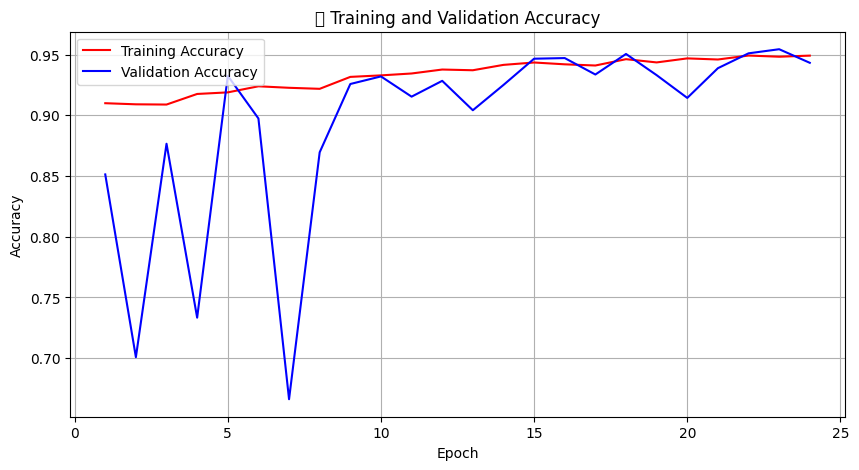

Glyph 128201 (\N{CHART WITH DOWNWARDS TREND}) missing from font(s) DejaVu Sans.


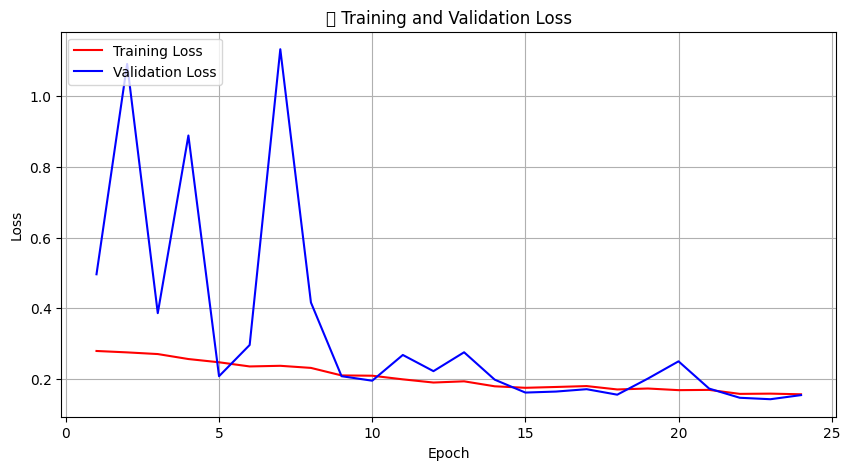

In [42]:
import matplotlib.pyplot as plt

# Ambil nilai akurasi dan loss dari history
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

# Buat list epoch
epochs = range(1, len(acc) + 1)

# Plot akurasi
plt.figure(figsize=(10, 5))
plt.plot(epochs, acc, 'r', label='Training Accuracy')
plt.plot(epochs, val_acc, 'b', label='Validation Accuracy')
plt.title('📈 Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(loc='upper left')
plt.grid(True)
plt.show()

# Plot loss
plt.figure(figsize=(10, 5))
plt.plot(epochs, loss, 'r', label='Training Loss')
plt.plot(epochs, val_loss, 'b', label='Validation Loss')
plt.title('📉 Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(loc='upper left')
plt.grid(True)
plt.show()


Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.


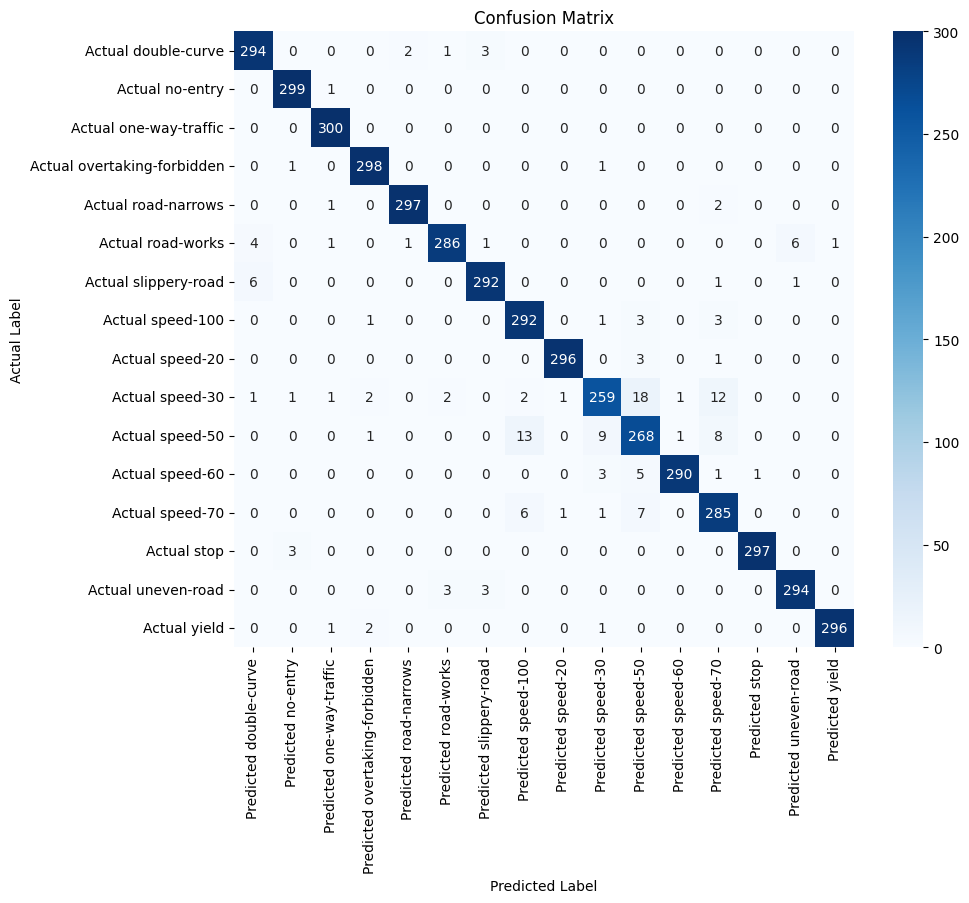


Classification Report:

                      precision    recall  f1-score   support

        double-curve     0.9639    0.9800    0.9719       300
            no-entry     0.9836    0.9967    0.9901       300
     one-way-traffic     0.9836    1.0000    0.9917       300
overtaking-forbidden     0.9803    0.9933    0.9868       300
        road-narrows     0.9900    0.9900    0.9900       300
          road-works     0.9795    0.9533    0.9662       300
       slippery-road     0.9766    0.9733    0.9750       300
           speed-100     0.9329    0.9733    0.9527       300
            speed-20     0.9933    0.9867    0.9900       300
            speed-30     0.9418    0.8633    0.9009       300
            speed-50     0.8816    0.8933    0.8874       300
            speed-60     0.9932    0.9667    0.9797       300
            speed-70     0.9105    0.9500    0.9299       300
                stop     0.9966    0.9900    0.9933       300
         uneven-road     0.9767    0.9800   

In [43]:
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Reset generator
test_generator.reset()

# Prediksi (hasilnya adalah probabilitas untuk masing-masing dari 7 kelas)
preds = model.predict(test_generator, verbose=0)

# Konversi prediksi dan label asli dari one-hot ke label integer
y_pred = np.argmax(preds, axis=1)
y_true = test_generator.classes

# Nama kelas (harus sama urutan dengan saat membuat generator)
class_names = list(test_generator.class_indices.keys())

# Confusion matrix
cm = confusion_matrix(y_true, y_pred)
cm_df = pd.DataFrame(cm, index=[f"Actual {cls}" for cls in class_names],
                        columns=[f"Predicted {cls}" for cls in class_names])

# Plot confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm_df, annot=True, fmt="d", cmap="Blues")
plt.title("Confusion Matrix")
plt.ylabel("Actual Label")
plt.xlabel("Predicted Label")
plt.show()

# Classification report
print("\nClassification Report:\n")
print(classification_report(y_true, y_pred, target_names=class_names, digits=4))


In [44]:
os.makedirs('submission/saved_model', exist_ok=True)
os.makedirs('submission/tflite', exist_ok=True)
os.makedirs('submission/tfjs_model', exist_ok=True)

In [46]:
model.export('submission/saved_model')

Saved artifact at 'submission/saved_model'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 150, 150, 1), dtype=tf.float32, name='keras_tensor_254')
Output Type:
  TensorSpec(shape=(None, 16), dtype=tf.float32, name=None)
Captures:
  139248225024912: TensorSpec(shape=(), dtype=tf.resource, name=None)
  139248225023184: TensorSpec(shape=(), dtype=tf.resource, name=None)
  139248225022992: TensorSpec(shape=(), dtype=tf.resource, name=None)
  139248225022032: TensorSpec(shape=(), dtype=tf.resource, name=None)
  139248225022224: TensorSpec(shape=(), dtype=tf.resource, name=None)
  139248225021840: TensorSpec(shape=(), dtype=tf.resource, name=None)
  139248225022608: TensorSpec(shape=(), dtype=tf.resource, name=None)
  139248225025488: TensorSpec(shape=(), dtype=tf.resource, name=None)
  139248225021648: TensorSpec(shape=(), dtype=tf.resource, name=None)
  139248225020112: TensorSpec(shape=(), dtype=tf.resource, name=None)
  139

In [47]:
converter = tf.lite.TFLiteConverter.from_saved_model('submission/saved_model')
tflite_model = converter.convert()

# Simpan TFLite model
with open('submission/tflite/model.tflite', 'wb') as f:
    f.write(tflite_model)

# Simpan label.txt
labels = list(train_generator.class_indices.keys())
with open('submission/tflite/label.txt', 'w') as f:
    for label in labels:
        f.write(f"{label}\n")

In [48]:
!pip install tensorflowjs

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.1/89.1 kB 3.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.0/53.0 kB 5.2 MB/s eta 0:00:00
  Attempting uninstall: packaging
    Found existing installation: packaging 24.2
    Uninstalling packaging-24.2:
      Successfully uninstalled packaging-24.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
db-dtypes 1.4.3 requires packaging>=24.2.0, but you have packaging 23.2 which is incompatible.
google-cloud-bigquery 3.32.0 requires packaging>=24.2.0, but you have packaging 23.2 which is incompatible.


In [49]:
!tensorflowjs_converter \
  --input_format=tf_saved_model \
  --output_format=tfjs_graph_model \
  submission/saved_model \
  submission/tfjs_model

2025-05-23 09:54:33.705624: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1747994073.725233   12290 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1747994073.731100   12290 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
🌲 Try https://ydf.readthedocs.io, the successor of TensorFlow Decision Forests with more features and faster training!
2025-05-23 09:54:40.039594: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:47] Overriding orig_value setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original config value was 0.
I0000 00:00:1747994080.039767   12290 gpu_device.cc:2022] Created device /job:localhost/replica:0/task

In [50]:
import shutil

shutil.make_archive('submission', 'zip', 'submission')


'/content/submission.zip'

In [51]:
from google.colab import files
files.download('submission.zip')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>